### Imports

In [2]:
import sys
from pathlib import Path
sys.path.insert(0, str(Path.cwd().parent))


from core import feat_selection as fs
import pandas as pd
import plotly.graph_objects as go
from matplotlib import pyplot as plt
from plotly.subplots import make_subplots

## Load Pre-computed Scores

In [3]:
## Performance scores are calculated as following: (code given here for reference)
skip = True
if not skip:
    all_tasks = pd.read_parquet(
        Path("../datasets/catch_22/checkpoints/ucr_hctsa_raw_removed.parquet"),
    )

    all_tasks_n = fs.normalize_features(all_tasks)
    all_tasks_n_pf = fs.filter_invalid_features(all_tasks_n.reset_index()) 
    nfolds = fs.num_of_folds(all_tasks_n_pf)
    perf_scores = fs.calc_per_feat_score(all_tasks_n_pf, nfolds)  # feature_cols=TEST_FEATURES)
    
    perf_scores.head()

In [4]:
perf_scores = pd.read_parquet(
    Path("../datasets/catch_22/checkpoints/final_perf_scores_all_features.parquet")
)

# Remove Statistically insignifcant featuers
- Stage 1 rejected features removed - using Table S1 from paper

In [5]:
random_perf_features = pd.read_csv(
    Path("../datasets/catch_22/checkpoints/catch22_insignificant_features_S1.txt"),
    comment="#",
    header=None,
    names=["p_value", "feature_name"],
)

# Get the list of features that performed no better than random
random_feature_names = random_perf_features["feature_name"].values

# Filter out random-performing features from the combined scores
perf_scores = perf_scores[
    [col for col in perf_scores.columns if col not in random_feature_names]
]

# Normalizing Raw Scores - to remove dataset complexity

*Note* : In the paper normalization per dataset is done by diving by mean accuracy. But I have found rest of analysis is more intuitive when computing z_score normalization

In [6]:
row_std = perf_scores.std(axis=1).clip(lower=1e-8)
# z-score normalization per dataset (subtract mean dataset_score and divide dataset std score)
perf_scores_norm = perf_scores.sub(perf_scores.mean(axis=1), axis=0).div(row_std, axis=0)

## combined accuracy per features
perf_scores_norm_comb = perf_scores_norm.mean()

# Stage 2: Performance Filtering

"From the features that performed significantly better than chance, we selected a subset of $\beta$ high-performing features by ranking them by their combined normalized accuracy $a_{n,c}$ (Fig. 1B), comparing values in the range $100 \leq \beta \leq 1000$".

Verify: hundreds of features survive; C22 features are among them.Paper gets ~710 survivors.

## KDE of Combined scores

In [7]:
perf_thresh = perf_scores_norm_comb.mean() + perf_scores_norm_comb.std()
from scipy.stats import gaussian_kde
import numpy as np
# Combined accuracy KDE
vals = perf_scores_norm_comb.dropna().values
kde = gaussian_kde(vals)
x_range = np.linspace(-3, 3, 500)
y = kde(x_range)
# mean subtracted to reproduce Fig 3A from paper
# x_range = (x_range - x_range.mean()) #/x_range.std()
#y /= y.max()

fig = go.Figure()
fig.add_trace(go.Scatter(
    x=x_range, y=y,
    mode="lines",
    line=dict(color="red", width=2.5),
    name="Combined Accuracy",
))
fig.update_layout(
    xaxis_title="Normalized Accuracy",
    yaxis_title="Normalized Density",
    xaxis=dict(dtick=0.2),
    yaxis=dict(dtick=0.5, range=[0,3.7]),
    width=1000,
    height=600,
    showlegend=True,
)

# mean subtracted to reproduce Fig 3A from paper
fig.add_vline(perf_thresh, line_dash="dash")
fig.show()


Combined scores follow a unimodal gaussian distribution, so the top performer can be selected by taking features with combined scores > mean + std

## Filtering by Combined Z-score

In [8]:
perf_thresh = perf_scores_norm_comb.mean() + perf_scores_norm_comb.std()
top_performers = perf_scores_norm_comb[perf_scores_norm_comb >= perf_thresh]
top_performers.shape
print(perf_thresh, perf_scores_norm_comb.shape[0], top_performers.shape[0])

# Check that C22 features are present in top_performers
c22_in_top = [f for f in fs.CATCH22 if f in top_performers.index]
c22_missing = [f for f in fs.CATCH22 if f not in top_performers.index]

print(f"C22 features in top_performers: {len(c22_in_top)}/{len(fs.CATCH22)}")
if c22_missing:
    print(f"Missing from top_performers: {c22_missing}")
else:
    print("All C22 features are present in top_performers.")

0.44459332365474713 6246 918
C22 features in top_performers: 20/20
All C22 features are present in top_performers.



# Final Stage 3: Redundancy Minimization


## Correlation Matrix
- many features have correlated performance, so it makes sense to cluster them by their correlation for minimizing redundancy

In [9]:

corr = perf_scores[top_performers.index].corr()
colorscale = [
    [0.0,  "#fff5eb"],  # 0.6
    [0.25, "#fff5eb"],
    [0.25, "#fdbe85"],  # 0.7
    [0.5,  "#fdbe85"],
    [0.5,  "#fd8d3c"],  # 0.8
    [0.75, "#fd8d3c"],
    [0.75, "#e6550d"],  # 0.9
    [1.0,  "#e6550d"],  # 1.0
]

fig = go.Figure(data=go.Heatmap(
    z=corr.values,
    zmin=0.6, zmax=1.0,
    colorscale=colorscale,
    colorbar=dict(
        title="Pearson correlation",
        tickvals=[0.65, 0.75, 0.85, 0.95],
        ticktext=["0.6", "0.7", "0.8", "0.9"],
    ),
))
fig.update_layout(
    width=700, height=700,
    title="Fig 3C: Correlation matrix of top-performing features",
    xaxis=dict(title="features", showticklabels=False),
    yaxis=dict(title="features", showticklabels=False, autorange="reversed"),
)
fig.show()

## Hierrarchichal Clustering

24 clusters from 918 features
                                 feature  cluster
890          MF_ExpSmoothing_05_best_mms        1
889         MF_ExpSmoothing_05_best_stde        1
888      MF_ExpSmoothing_05_best_meanabs        1
916   SD_SurrogateTest_RP_99_fmmi_zscore        1
917   SD_SurrogateTest_RP_99_fmmi_mediqr        2
..                                   ...      ...
181  CO_AddNoise_1_gaussian_firstUnder25       24
457              PH_Walker_prop_11_w_std       24
732     SP_Summaries_welch_rect_area_3_1       24
737     SP_Summaries_welch_rect_area_5_1       24
458              PH_Walker_prop_11_w_ac1       24

[918 rows x 2 columns]


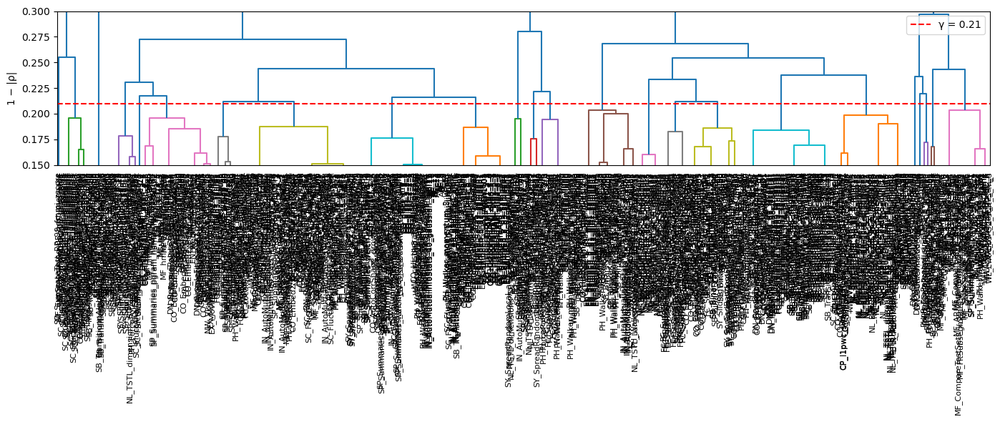

In [10]:
from scipy.cluster.hierarchy import dendrogram, fcluster, linkage
from scipy.spatial.distance import squareform

nf = len(top_performers)
gamma = 0.21
# 1. absolute Pearson correlation → distance
corr = perf_scores[list(top_performers.index)[:nf]].corr()
dist = 1 - corr.abs().copy()
# np.fill_diagonal(dist.values, 0)          # ensure exact zeros on diagonal
dist = dist.clip(lower=0)  # handle floating-point negatives

# 2. condensed distance matrix (upper triangle, no diagonal)
condensed = squareform(dist, checks=False)

# 3. hierarchical clustering — complete linkage
Z = linkage(condensed, method="complete")

# 4. cut tree at distance threshold γ
clusters = fcluster(Z, t=gamma, criterion="distance")

# 5. summary
cluster_df = pd.DataFrame({"feature": list(top_performers.index)[:nf], "cluster": clusters})
print(f"{cluster_df['cluster'].nunique()} clusters from {len(cluster_df)} features")
print(cluster_df.sort_values("cluster"))

# 6. (optional) dendrogram
fig, ax = plt.subplots(figsize=(14, 6))
dendrogram(
    Z,
    labels=top_performers.index.tolist()[:nf],
    ax=ax,
    color_threshold=gamma,
    leaf_rotation=90,
    leaf_font_size=8,
)
ax.axhline(gamma, ls="--", color="red", label=f"γ = {gamma}")
ax.set_ylim(0.15, 0.3)
ax.set_ylabel("1 − |ρ|")
ax.legend()
plt.tight_layout()
plt.show()

## plot cluster scores


In [11]:
# score_df = final_perf_scores
acc_mean = {}
acc_z_score = {}
c22_acc_mean = {}
c22_acc_z_score = {}

for cluster, df in cluster_df.groupby("cluster"):
    features = df["feature"].tolist()
    scores = perf_scores_norm_comb[features]
    acc_mean[cluster] = scores
    acc_z_score[cluster] = (scores - scores.mean()) / scores.std()

    c22_in_cluster = [f for f in features if f in fs.CATCH22]
    if c22_in_cluster:
        c22_scores = perf_scores_norm_comb[c22_in_cluster]  # .mean(axis=0)
        c22_acc_mean[cluster] = acc_mean[cluster][c22_in_cluster]
        c22_acc_z_score[cluster] = acc_z_score[cluster][c22_in_cluster] 


for title, whole, c22 in [("Mean Accuracy", acc_mean, c22_acc_mean)]: # ("Z Score of Combined Norm", acc_z_score, c22_acc_z_score)]: 
    whole_df = pd.DataFrame(whole)
    whole_df.columns = [f"Cluster {c}" for c in whole.keys()]
    whole_df = whole_df.sort_index()
    fig = make_subplots(specs=[[{"secondary_y": True}]])

    # Box plots of cluster accuracies across datasets
    for col in whole_df.columns:
        fig.add_trace(
            go.Box(y=whole_df[col], name=col, showlegend=False),
            secondary_y=False,
        )

    # Individual catch22 feature normalized accuracy from c22_cluster_scores
    for cluster, scores in c22.items():
        fig.add_trace(
            go.Scatter(
                x=[f"Cluster {cluster}"] * len(scores),
                y=scores.values,
                mode="markers+text",
                name="Catch22 Features",
                showlegend=(cluster == list(c22.keys())[0]),
                marker=dict(color="red", size=10, symbol="diamond"),
                text=scores.index,
                textposition="top center",
                textfont=dict(size=8),
            ),
        )

    fig.update_layout(
        title="Cluster Accuracy Distribution with Catch22 Feature Positions",
        xaxis_title="Cluster",
        width=1100,
        height=600,
    )
    fig.update_yaxes(title_text="Normalized Accuracy", secondary_y=False)
    fig.show()

## Diversity of Canonical Set
- Reproduce Fig5 from paper

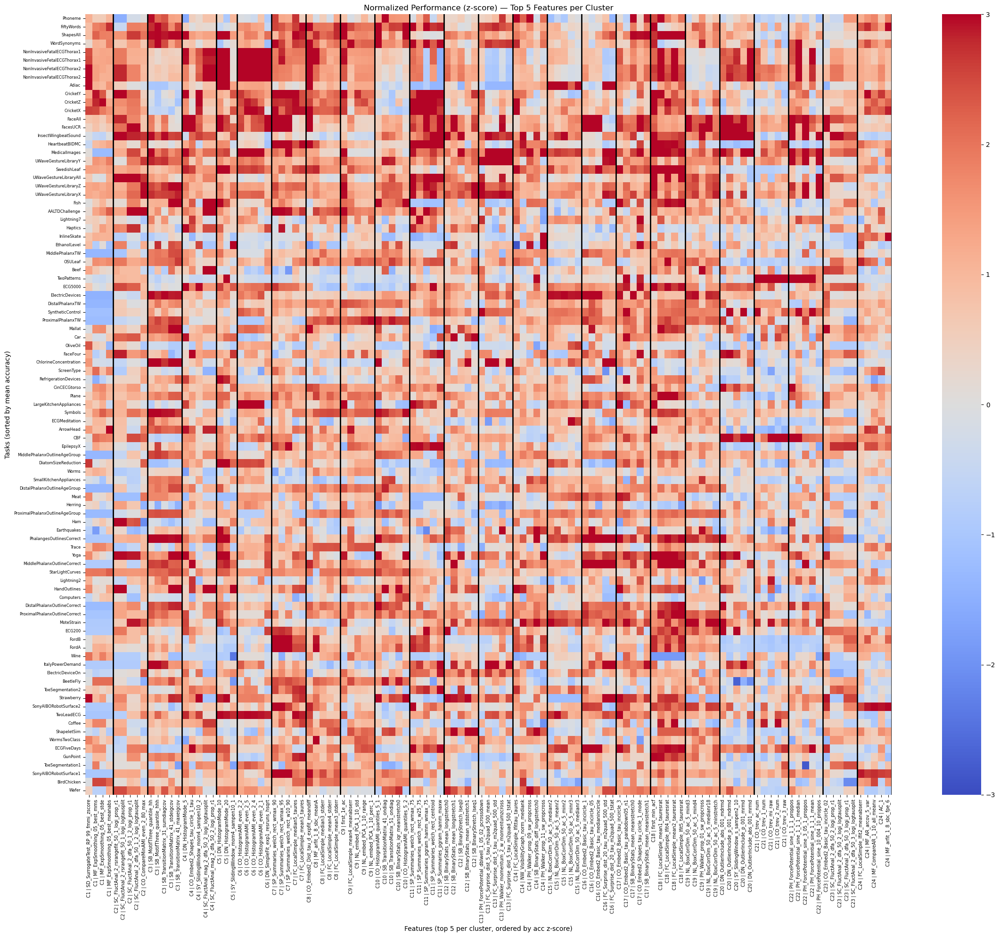

In [12]:
# Heatmap of z-scored performance across tasks and features
#
# X-axis (columns): Top 5 features per cluster, selected by highest acc_z_score
#   within each cluster. Features are grouped by cluster (ascending cluster id),
#   and within each cluster ordered by acc_z_score (best first, left to right).
#   Labels show cluster id and feature name: "C{id} | {feature}".
#
# Y-axis (rows): Tasks sorted by mean raw accuracy across all features
#   (ascending, so hardest tasks at the top, easiest at the bottom).
#   This ordering reflects task complexity.

import seaborn as sns

top_features = []
feature_xlabels = []
for cluster_id in sorted(acc_z_score.keys()):
    scores = acc_z_score[cluster_id].sort_values(ascending=False)
    top5 = scores.head(5).index.tolist()
    top_features.extend(top5)
    feature_xlabels.extend([f"C{cluster_id} | {f}" for f in top5])

# Keep only features present in perf_scores_norm
keep = [i for i, f in enumerate(top_features) if f in perf_scores_norm.columns]
feature_order = [top_features[i] for i in keep]
xlabels = [feature_xlabels[i] for i in keep]

# Build cluster labels for boundary lines
cluster_map = cluster_df.set_index("feature")["cluster"]
cluster_labels = cluster_map.loc[feature_order]

task_order = perf_scores.mean(axis=1).sort_values().index

heatmap_data = perf_scores_norm.loc[task_order, feature_order]
n_tasks = len(task_order)

fig, ax = plt.subplots(figsize=(max(20, len(feature_order) * 0.2), max(20, len(task_order) * 0.2)))
sns.heatmap(heatmap_data, cmap="coolwarm", center=0, ax=ax,
            xticklabels=xlabels, yticklabels=True, vmin=-3, vmax=3)

# Draw vertical lines at cluster boundaries
x_pos = 0
for cluster_id, group in cluster_labels.groupby(cluster_labels, sort=False):
    x_pos += len(group)
    ax.axvline(x=x_pos, color="black", linewidth=2)

ax.set_xlabel("Features (top 5 per cluster, ordered by acc z-score)")
ax.set_ylabel("Tasks (sorted by mean accuracy)")
ax.set_title("Normalized Performance (z-score) — Top 5 Features per Cluster")
ax.tick_params(axis="x", labelsize=7, rotation=90)
ax.tick_params(axis="y", labelsize=6)
plt.tight_layout()
plt.show()

# Conclusions
1. Cluster 5 seems to have all features outperforming the mean accuracy for majority of the datasets.
2. DN_HistogramMode_10 has the best combined accuracy, TODO: Why- what is this feature? 
3. Some C22 features end up in the same cluster, TODO: check their correlation distance
   

## Next Steps
- Compare single-feature vs. full catch22 accuracy:

    Which tasks does DN_HistogramMode_10 alone nail, and which does it fail? Looking at the per-task accuracy breakdown tells you what kind of classification signal that feature carries — and by contrast, what the other 21 features are compensating for. This is how you build intuition for the complementarity argument behind the whole catch22 selection.
    Is the accuracy gap uniform or concentrated? If HistogramMode alone gets 80% of catch22's performance on 60 tasks and 30% on the other 33, you've identified the tasks where dynamical/transition features actually earn their keep. That's a much more interesting finding than "22 features > 1 feature".
    What's the marginal contribution curve? Start with HistogramMode, add the next-best feature from a different cluster, then the next — how quickly does accuracy saturate? This is the classical ablation pattern and it maps directly onto the feature-store decision ("do I need 26 features or will 8 do?").

- Curate features from the clusters
  - explain what property of the series each feature measures and why it was picked.

   